# Insurance Claims- Fraud Detection :-

# Problem Statement:-

Business case:-

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made.

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.

Import all the required library:-

In [75]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')

# importing DataSet:-

In [76]:
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')

In [77]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [78]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


# Dataset inspection:-

In [79]:
df.shape

(1000, 40)

In [80]:
print('This dataset has {} observations with {} features.'.format(df.shape[0], df.shape[1]))

This dataset has 1000 observations with 40 features.


In [81]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

These are the columns which are present in our dataset

In [82]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

As we can see there is intiger,float and object datatype are present in this dataset

In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

As we can see in _c39 there 0 non-null values are present in this dataset.
so its a unnessesary column and i have to delete that.

In [84]:
df.drop("_c39",axis=1, inplace=True)

In [85]:
df.shape

(1000, 39)

here we have deleted 1 column

In [86]:
# lets check the unique values present in all columns of the dataset
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

-As we can see theer is lots of unique values are present in each columns in this dataset.
-policy_number and incident_location columns have all the unique values soo mo need of those columns we have to delete those columns.

In [87]:
df=df.drop(["policy_number","incident_location"],axis=1)

In [88]:
df.shape

(1000, 37)

we hav successfully delete two more rows

# Checking Null values in the Dataset:-

In [89]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

As we can see there is no null values are present in this dataset

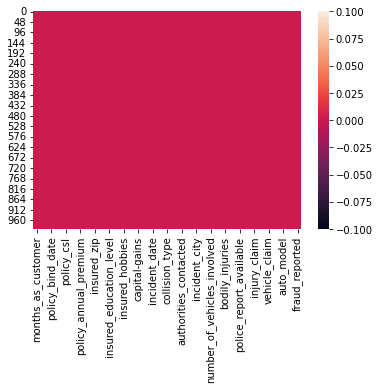

In [90]:
sns.heatmap(df.isnull())
plt.show()

above heatmap shows there is no null values are present in this dataset

# check Value counts:-

In [91]:
df.columns

Index(['months_as_customer', 'age', 'policy_bind_date', 'policy_state',
       'policy_csl', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'fraud_reported'],
      dtype='object')

In [92]:
for i in df.columns:
    print(df[i].value_counts())
    print("------------------------")

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
------------------------
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
------------------------
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64
------------------------
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
------------------------
250/500     351
100/30

In [93]:
df=df.drop(["umbrella_limit","insured_zip"],axis=1)

In [94]:
df.shape

(1000, 35)

here we had dropped two more columns 


# Describe the dataset:-

In [95]:
# lets see statistical description of all the columns in the dataset
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


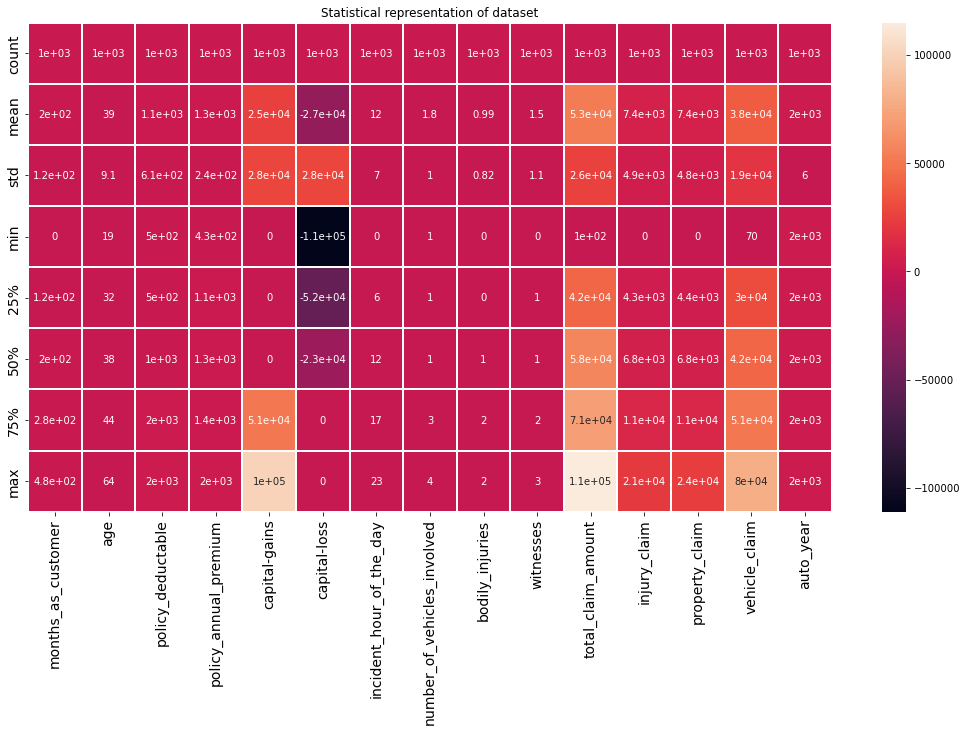

In [96]:
plt.figure(figsize=(18,9))
sns.heatmap(df.describe(),linewidth=.2, annot=True,fmt=".2g")
plt.title("Statistical representation of dataset")
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

# Extracting Data:-

In [97]:
#Extracting object to datetime
df['incident_date']= pd.to_datetime(df['incident_date'])
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])

In [98]:
df.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                          object
incident_hour_of_the_day          

we can see it has changed to datetime data type

In [99]:
#extract day,monh & year using lambda function
df["incident_day"]=df["incident_date"].apply(lambda x:x.day)
df['incident_month']=df["incident_date"].apply(lambda x:x.month)
df['incident_year']=df['incident_date'].apply(lambda x:x.year)

In [100]:
df['policy_bind_day']=df['policy_bind_date'].apply(lambda x:x.day)
df['policy_bind_month']=df['policy_bind_date'].apply(lambda x:x.month)
df['policy_bind_year']=df['policy_bind_date'].apply(lambda x:x.year)

In [101]:
df.head()

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,...,auto_make,auto_model,auto_year,fraud_reported,incident_day,incident_month,incident_year,policy_bind_day,policy_bind_month,policy_bind_year
0,328,48,2014-10-17,OH,250/500,1000,1406.91,MALE,MD,craft-repair,...,Saab,92x,2004,Y,25,1,2015,17,10,2014
1,228,42,2006-06-27,IN,250/500,2000,1197.22,MALE,MD,machine-op-inspct,...,Mercedes,E400,2007,Y,21,1,2015,27,6,2006
2,134,29,2000-06-09,OH,100/300,2000,1413.14,FEMALE,PhD,sales,...,Dodge,RAM,2007,N,22,2,2015,9,6,2000
3,256,41,1990-05-25,IL,250/500,2000,1415.74,FEMALE,PhD,armed-forces,...,Chevrolet,Tahoe,2014,Y,1,10,2015,25,5,1990
4,228,44,2014-06-06,IL,500/1000,1000,1583.91,MALE,Associate,sales,...,Accura,RSX,2009,N,17,2,2015,6,6,2014


Now we have to delete policy_bind_date & incident_date columns

In [102]:
df.drop(['incident_date','policy_bind_date'], axis=1, inplace=True)

In [103]:
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,auto_make,auto_model,auto_year,fraud_reported,incident_day,incident_month,incident_year,policy_bind_day,policy_bind_month,policy_bind_year
0,328,48,OH,250/500,1000,1406.91,MALE,MD,craft-repair,sleeping,...,Saab,92x,2004,Y,25,1,2015,17,10,2014
1,228,42,IN,250/500,2000,1197.22,MALE,MD,machine-op-inspct,reading,...,Mercedes,E400,2007,Y,21,1,2015,27,6,2006
2,134,29,OH,100/300,2000,1413.14,FEMALE,PhD,sales,board-games,...,Dodge,RAM,2007,N,22,2,2015,9,6,2000
3,256,41,IL,250/500,2000,1415.74,FEMALE,PhD,armed-forces,board-games,...,Chevrolet,Tahoe,2014,Y,1,10,2015,25,5,1990
4,228,44,IL,500/1000,1000,1583.91,MALE,Associate,sales,board-games,...,Accura,RSX,2009,N,17,2,2015,6,6,2014


In [104]:
for i in df.columns:
    print(df[i].value_counts())
    print('------------------------------------------')

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
------------------------------------------
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
------------------------------------------
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
------------------------------------------
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64
------------------------------------------
1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64
-----------------------

-Here we can see that incident_year is having all same values i.e 2015. it will not do anything good in predicting our model, so, lets drop this columns.

In [105]:
df=df.drop(['incident_year'],axis=1)

In [106]:
df[df.columns[(df == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

In [107]:
df['collision_type'].mode()

0    Rear Collision
dtype: object

In [108]:
df['collision_type']=df.collision_type.str.replace('?','Rear Collision')

In [110]:
df['property_damage'] = df.property_damage.str.replace('?','NO')

In [111]:
df['police_report_available'] = df.police_report_available.str.replace('?', 'NO')

In [113]:
df.isin(["?"]).sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_claim                  0
auto_make                      0
auto_model

# Find catagorical & numerical data:-

In [116]:
categorical_col=[]
for i in df.dtypes.index:
    if  df.dtypes[i]=='object':
        categorical_col.append(i)
print(categorical_col)

['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


the above columns names are the Catagorical columns

In [117]:
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print(numerical_col)

['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'incident_day', 'incident_month', 'policy_bind_day', 'policy_bind_month', 'policy_bind_year']


The above columns are the Numerical columns

# EDA:-

# i.Univariate Analysis:-

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64

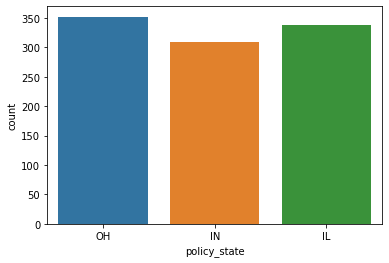

In [122]:
sns.countplot(x='policy_state',data=df)
df['policy_state'].value_counts()

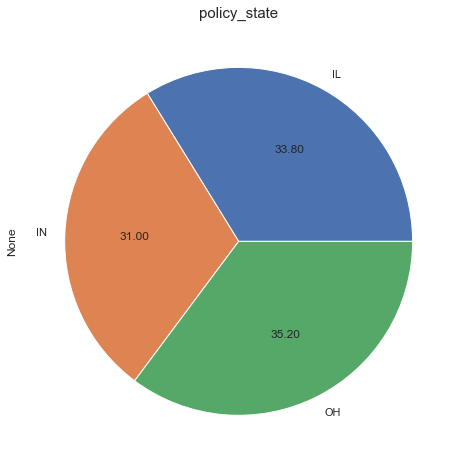

In [123]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,8))
plt.subplot(1,2,2)
df.groupby("policy_state").size().plot(kind='pie', autopct='%.2f')
plt.title("policy_state", fontsize=15)
plt.show()

N    753
Y    247
Name: fraud_reported, dtype: int64

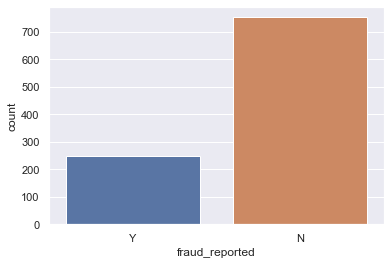

In [124]:
sns.countplot(x='fraud_reported',data=df)
df['fraud_reported'].value_counts()

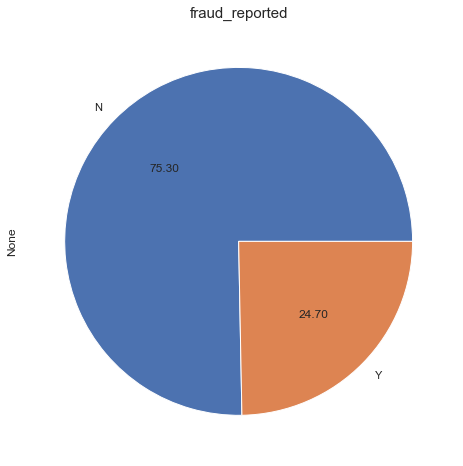

In [125]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,8))
plt.subplot(1,2,2)
df.groupby('fraud_reported').size().plot(kind='pie', autopct='%.2f')
plt.title('fraud_reported', fontsize=15)
plt.show()

here we can see 24.70% which is 247 in counts have reported fraud.

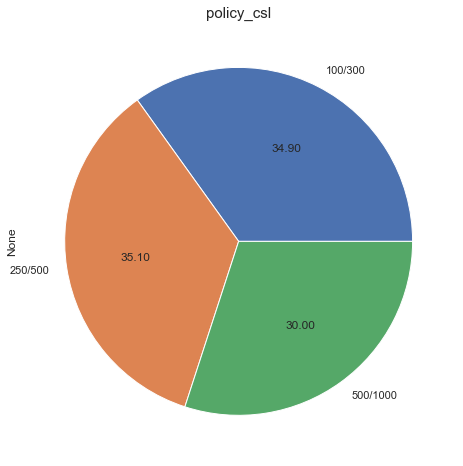

In [126]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,8))
plt.subplot(1,2,2)
df.groupby('policy_csl').size().plot(kind='pie', autopct='%.2f')
plt.title('policy_csl', fontsize=15)
plt.show()

Here we can see 100/300 And 250/500 have equaly distributed

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64

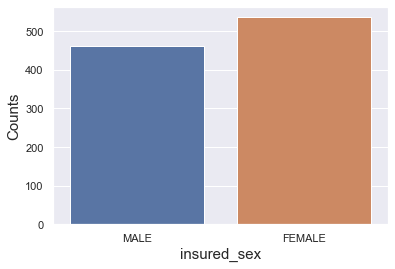

In [135]:
sns.countplot(df['insured_sex'])
plt.xlabel('insured_sex', fontsize=15)
plt.ylabel('Counts', fontsize=15)
df['insured_sex'].value_counts()

As we can see insured sex male are 463 where the female are537

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64

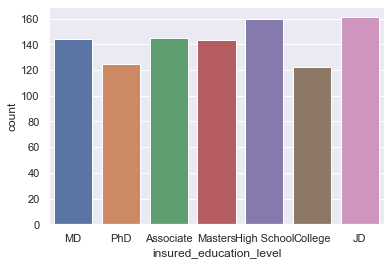

In [140]:
sns.countplot(df['insured_education_level'])
df['insured_education_level'].value_counts()

As we can see most of the insured persons have qualification of  JD and Highschool and all are equali distributed

machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64

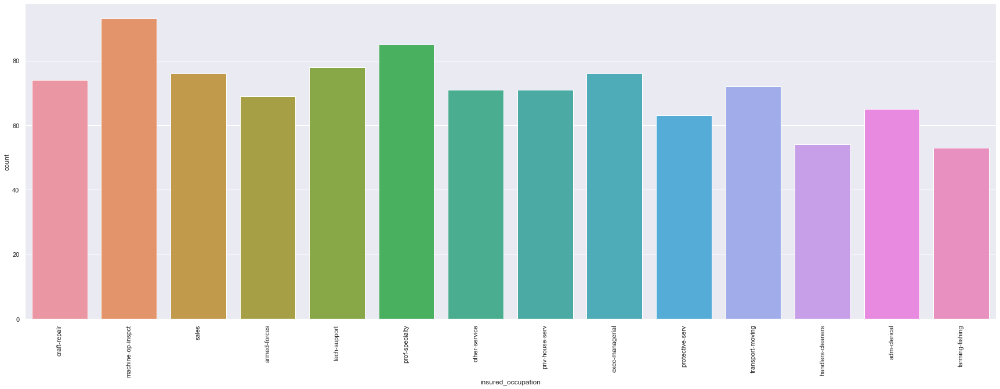

In [144]:
plt.figure(figsize=(30,10))
sns.countplot(df['insured_occupation'])
plt.xticks(rotation=90)
df['insured_occupation'].value_counts()

Here we can see most no of insured occupation is machine-op-inspct

There is alot of columns soo here i am run those at a time:-

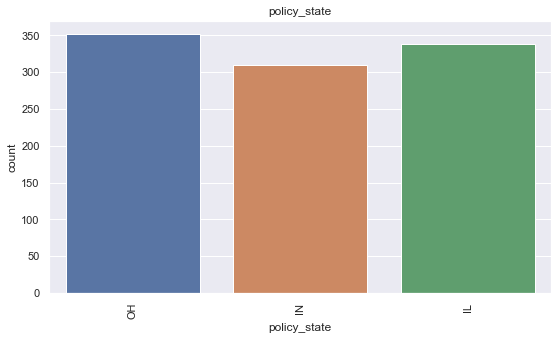

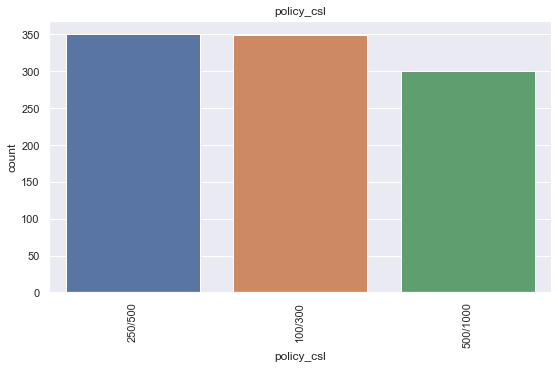

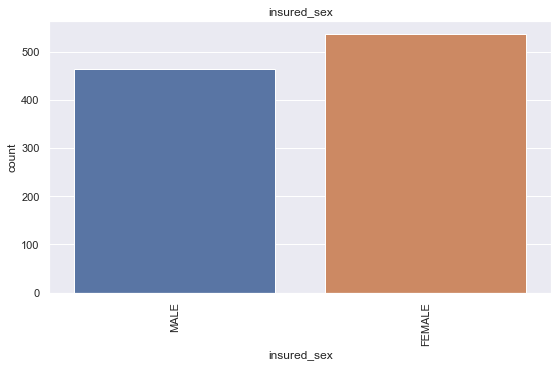

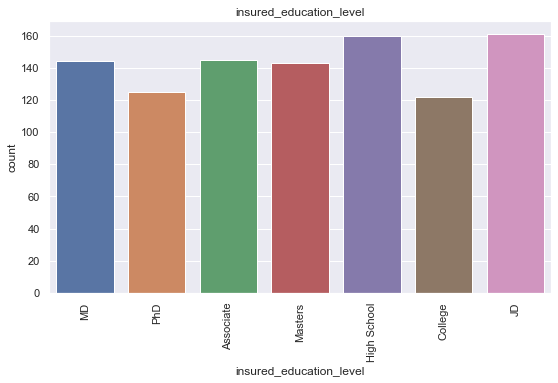

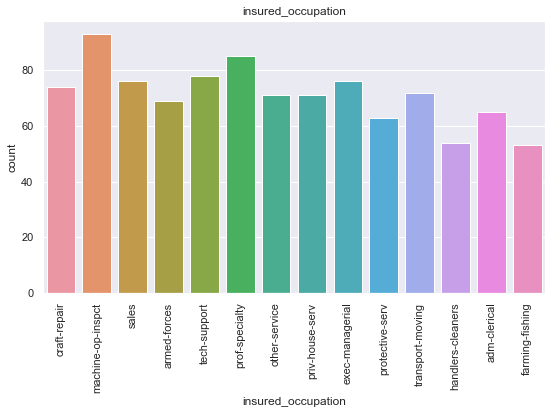

...

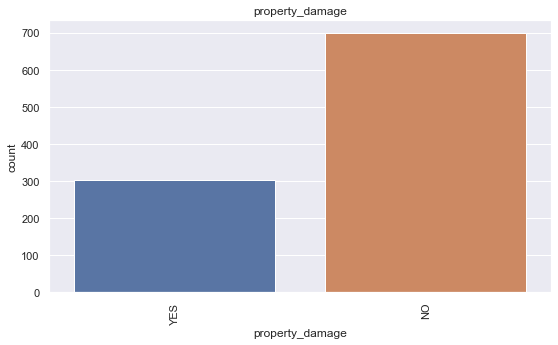

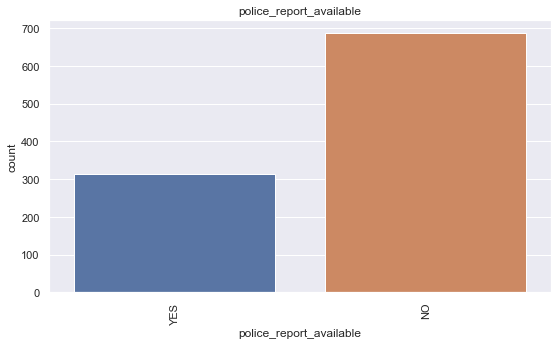

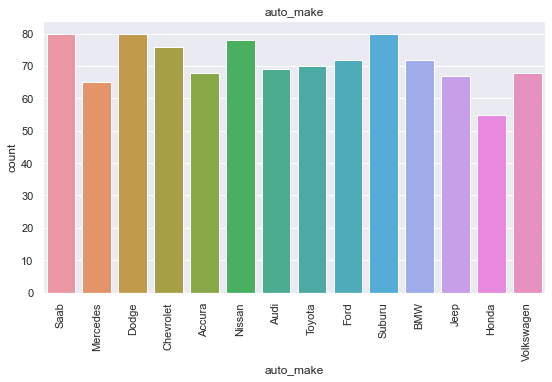

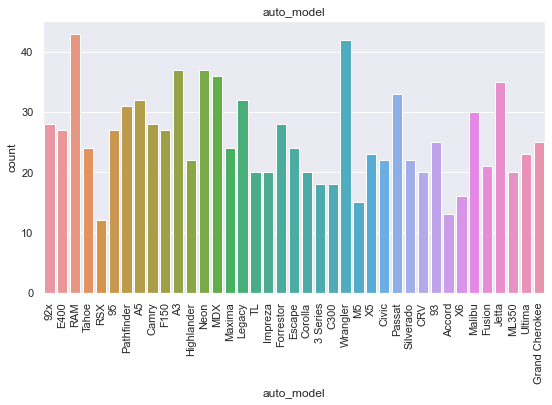

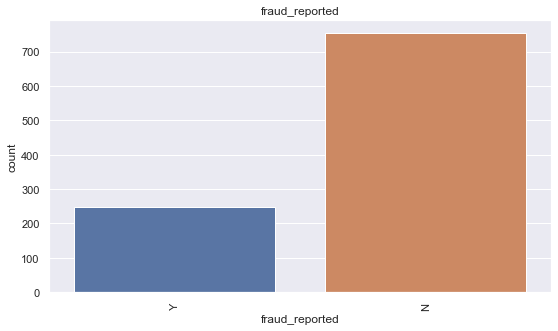

In [147]:
for i in df[categorical_col]:
    plt.figure(figsize=(9,5))
    sns.countplot(df[i])
    df[i].value_counts()
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

# Data distribution for Numerical columns:-

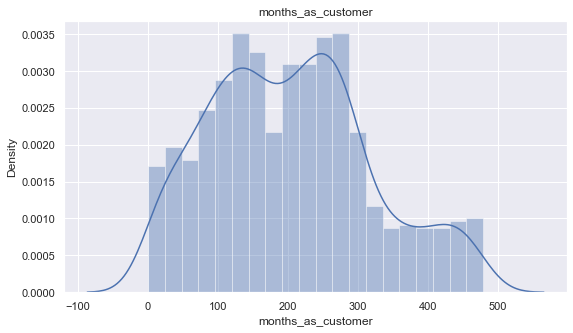

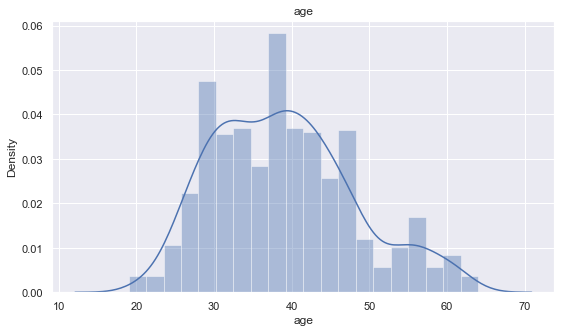

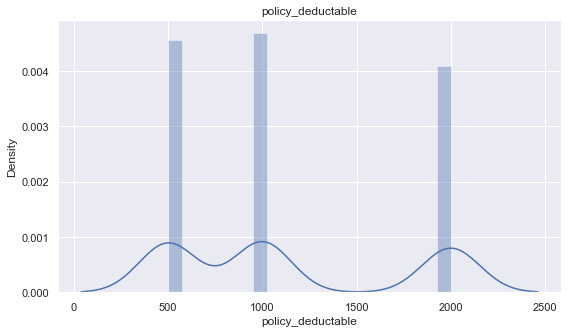

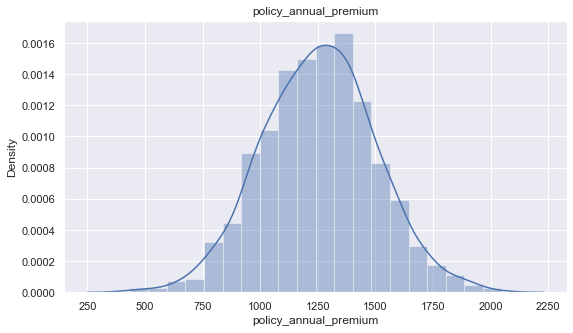

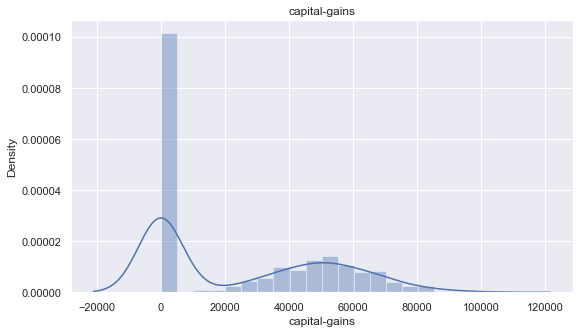

...

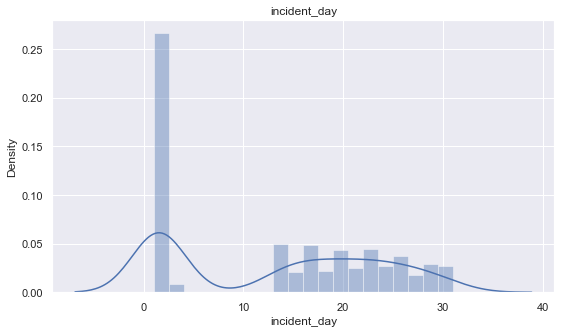

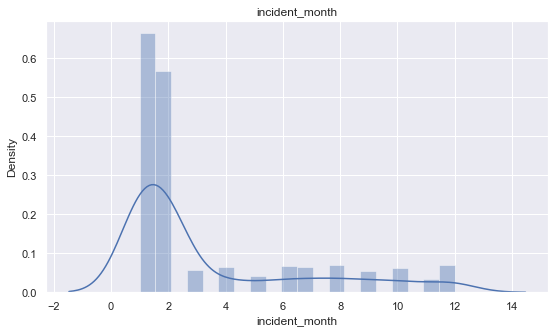

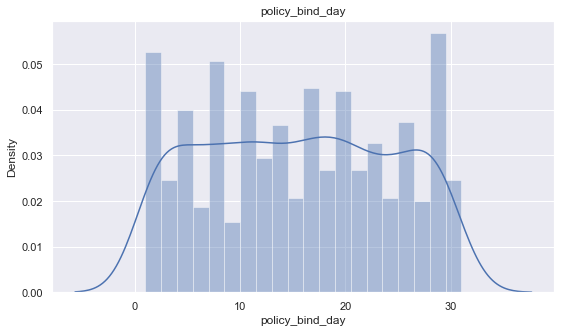

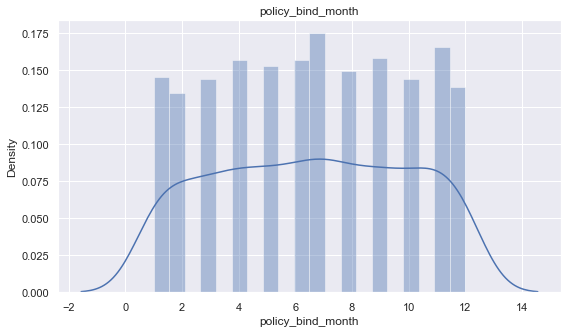

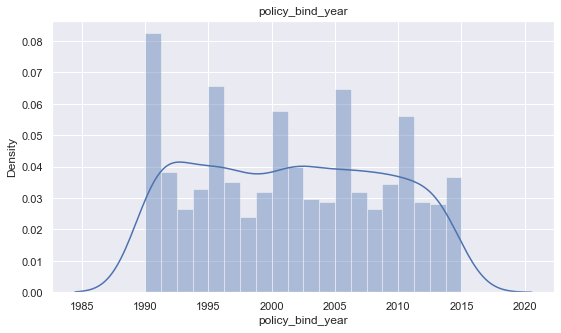

In [148]:
for i in df[numerical_col]:
  plt.figure(figsize=(9,5))
  sns.distplot(df[i], bins=20)
  plt.title(i)
  plt.show()

Here we can see that few columns are skewed towards left.Some are equally distributed

# Bivariate Analysis :-

<AxesSubplot:xlabel='insured_sex', ylabel='count'>

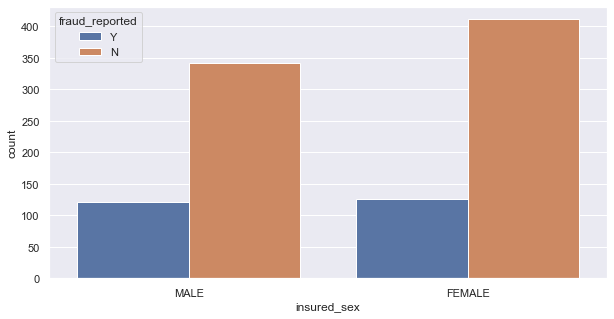

In [150]:
plt.figure(figsize = (10,5))
sns.countplot(x='insured_sex',hue='fraud_reported',data=df)

Here we can see the no of male 7 female are almost same

<AxesSubplot:xlabel='insured_occupation', ylabel='count'>

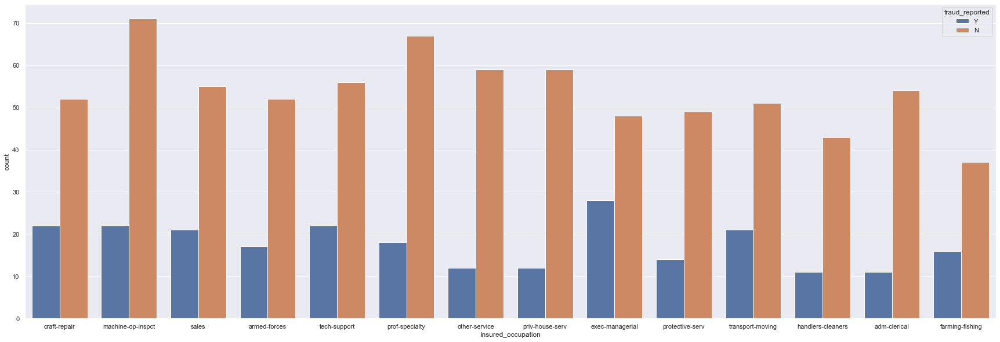

In [152]:
plt.figure(figsize = (30,10))
sns.countplot(x='insured_occupation',hue='fraud_reported',data=df)

We can see most no of fraud_reported occupation is Exec-managerial

<AxesSubplot:xlabel='insured_hobbies', ylabel='count'>

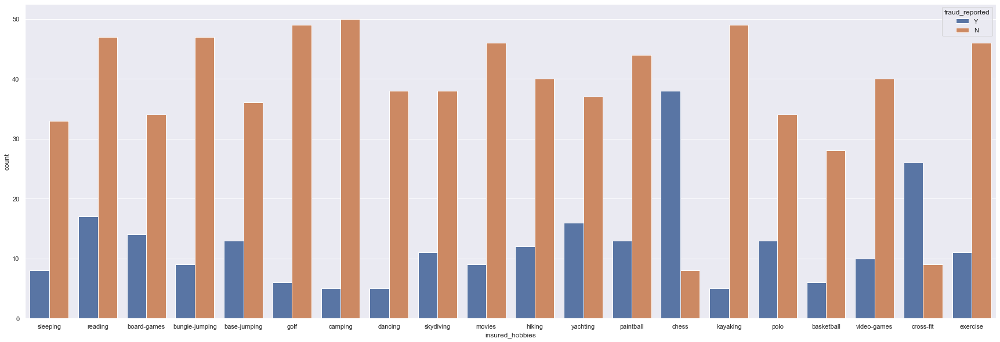

In [153]:
plt.figure(figsize = (30,10))
sns.countplot(x='insured_hobbies',hue='fraud_reported',data=df)

Most no of fraud reported found where the insured have chess hobbies.

<AxesSubplot:xlabel='incident_type', ylabel='count'>

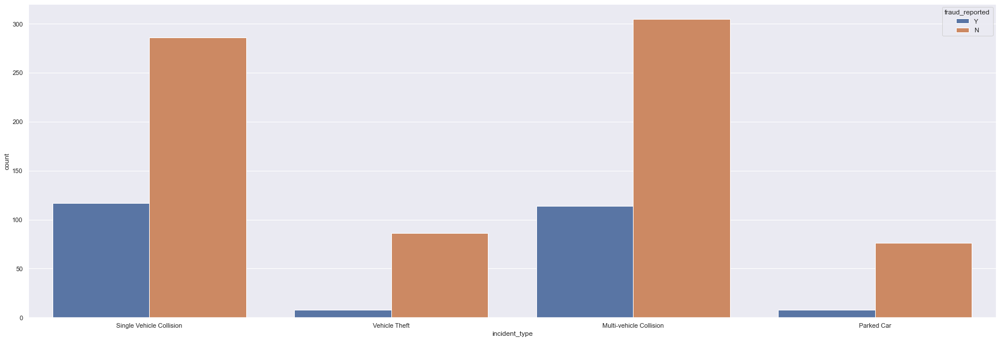

In [154]:
plt.figure(figsize = (30,10))
sns.countplot(x='incident_type',hue='fraud_reported',data=df)

Most no of fraud reported found if there is single vehicle collision and in multi vehicle collision

<AxesSubplot:xlabel='collision_type', ylabel='count'>

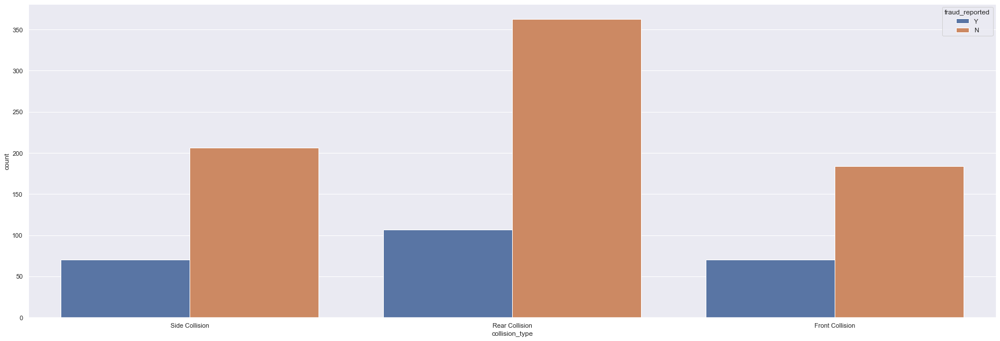

In [156]:
plt.figure(figsize = (30,10))
sns.countplot(x='collision_type',hue='fraud_reported',data=df)

Most of the fraud reported collision is rear collision

<AxesSubplot:xlabel='incident_severity', ylabel='count'>

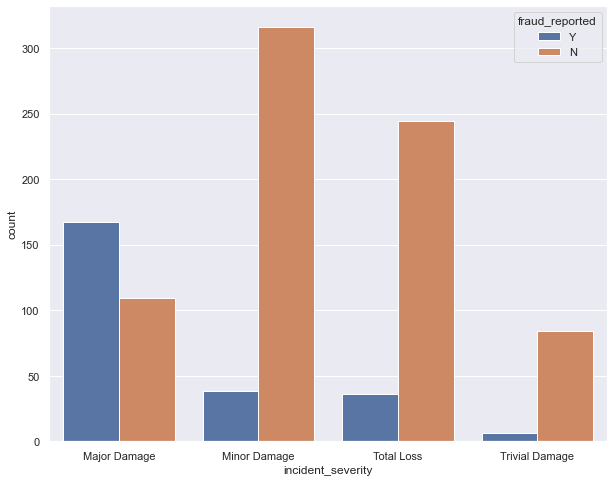

In [157]:
plt.figure(figsize = (10,8))
sns.countplot(x='incident_severity',hue='fraud_reported',data=df)

here we can see Most of the fraud_reported found if there is a major Damage

<AxesSubplot:xlabel='authorities_contacted', ylabel='count'>

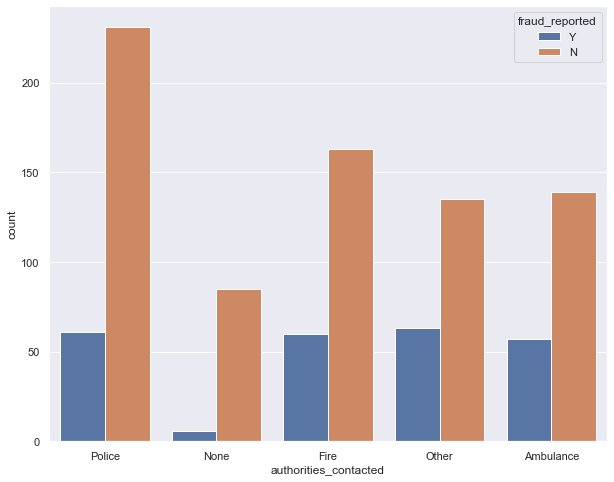

In [158]:
plt.figure(figsize = (10,8))
sns.countplot(x='authorities_contacted',hue='fraud_reported',data=df)

Here all the authorities_contacted are equaly distributed

<AxesSubplot:xlabel='incident_state', ylabel='count'>

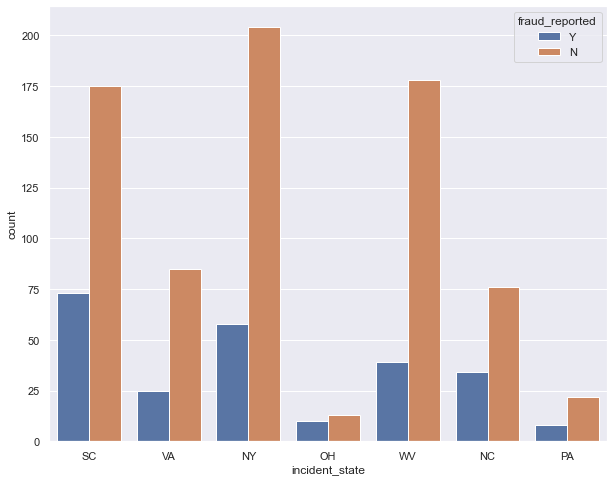

In [159]:
plt.figure(figsize = (10,8))
sns.countplot(x='incident_state',hue='fraud_reported',data=df)

Most fraud reported incident_state is Sc & NY

<AxesSubplot:xlabel='incident_city', ylabel='count'>

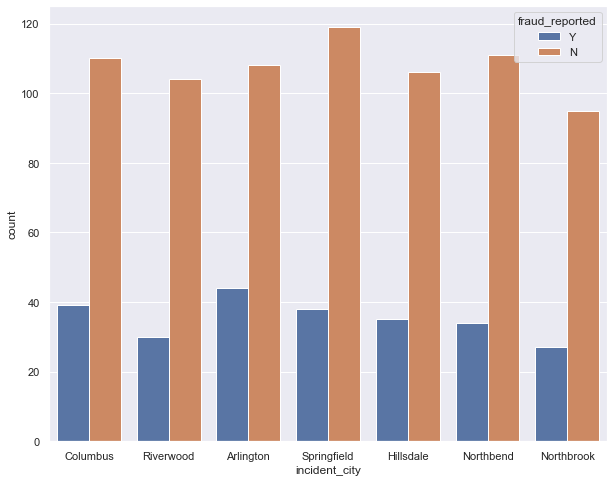

In [160]:
plt.figure(figsize = (10,8))
sns.countplot(x='incident_city',hue='fraud_reported',data=df)

Arlington is the most fraud_reported city

<AxesSubplot:title={'center':'Comparision between months_as_customer and total_claim_amount'}, xlabel='months_as_customer', ylabel='total_claim_amount'>

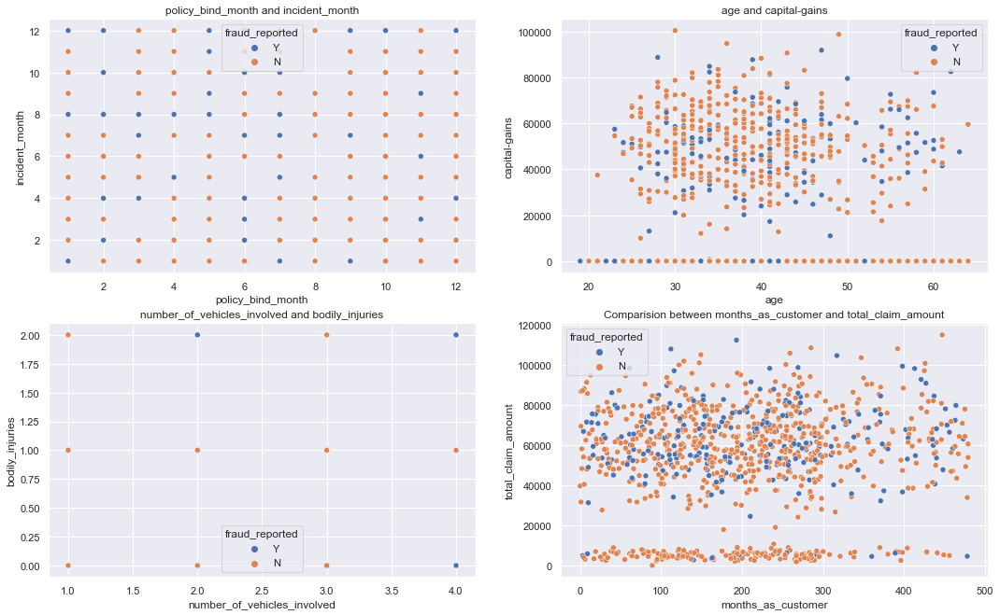

In [166]:
plt.figure(figsize=[18,11])

plt.subplot(2,2,1)
plt.title('policy_bind_month and incident_month')
sns.scatterplot(df['policy_bind_month'],df['incident_month'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('age and capital-gains')
sns.scatterplot(df['age'],df['capital-gains'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('number_of_vehicles_involved and bodily_injuries')
sns.scatterplot(df['number_of_vehicles_involved'],df['bodily_injuries'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported'])

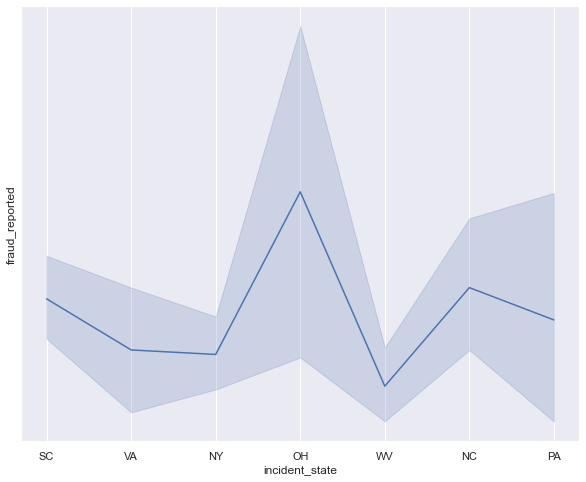

In [167]:
plt.figure(figsize=(10,8))
sns.lineplot(y="fraud_reported",x="incident_state",data=df)
plt.show()

Here we can see that most frauds were reported from state CH and least were reported from the state Wv.

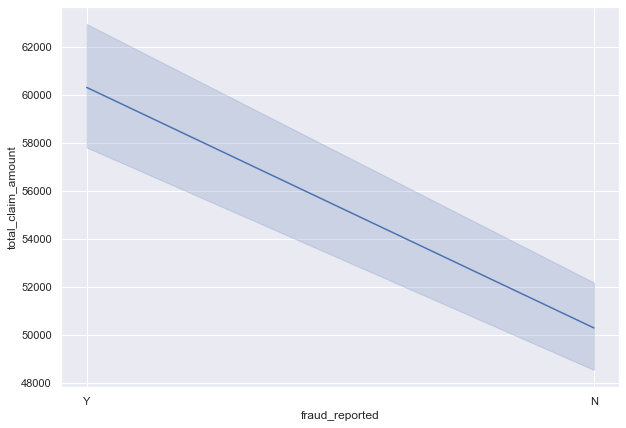

In [168]:
plt.figure(figsize=(10,7))
sns.lineplot(x="fraud_reported",y="total_claim_amount",data=df)
plt.show()

here we can see correlation of total_amount claim and fraud_reported

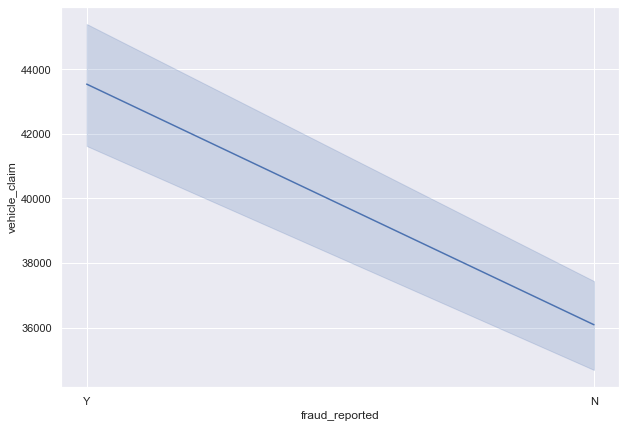

In [169]:
plt.figure(figsize=(10,7))
sns.lineplot(x="fraud_reported",y="vehicle_claim",data=df)
plt.show()

we can see correlation of vehicle_claim and fraud_reported.

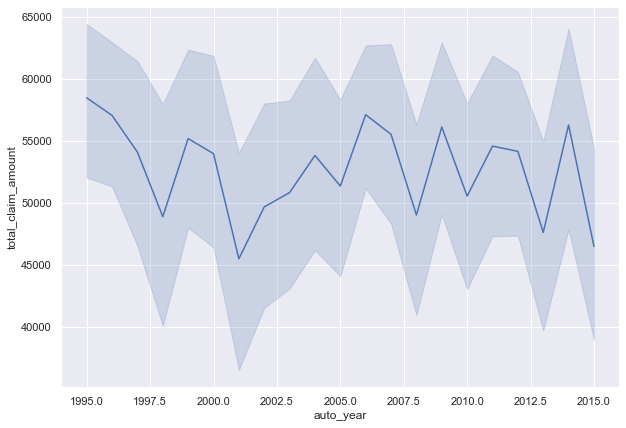

In [171]:
plt.figure(figsize=(10,7))
sns.lineplot(x="auto_year",y="total_claim_amount",data=df)
plt.show()

 we can see that most of the amount claimed was for automobile manufactured in 2006 and before 1995.

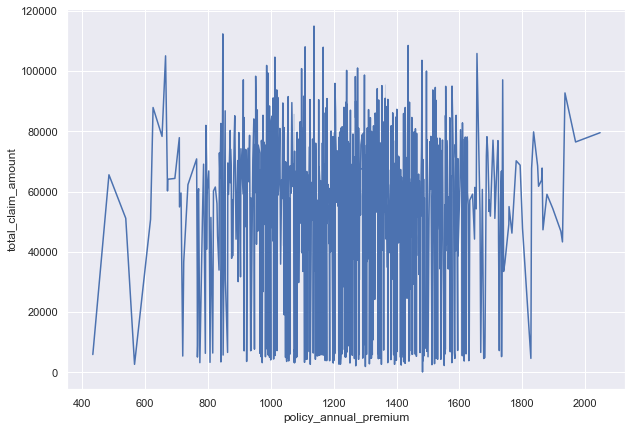

In [172]:
plt.figure(figsize=(10,7))
sns.lineplot(x="policy_annual_premium",y="total_claim_amount",data=df)
plt.show()

Here We can see that most of the people pay annual premium in the range of 800 to 1600 dollor per annum.

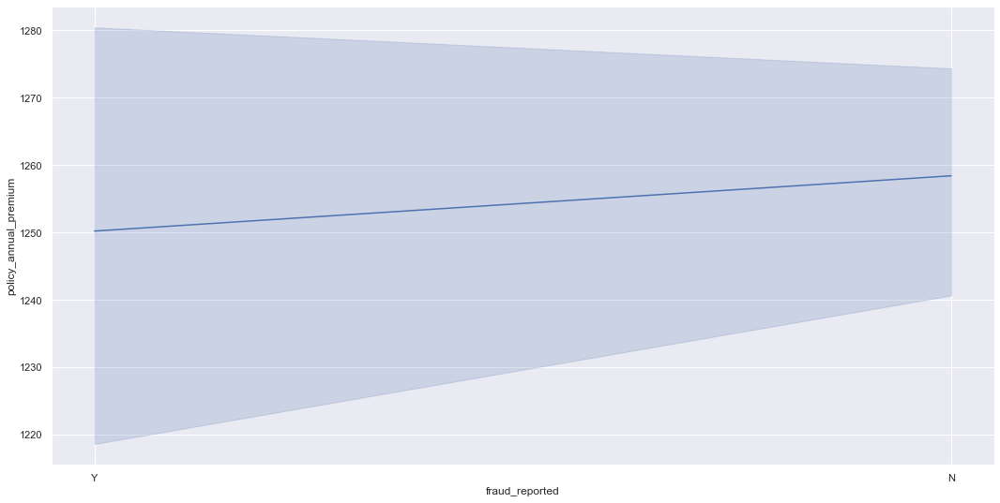

In [173]:
plt.figure(figsize=(18,9))
sns.lineplot(x="fraud_reported",y="policy_annual_premium",data=df)
plt.show()

There is no relation between policy annual premium and fraud_reported.

# MultiVariate Analysis :-

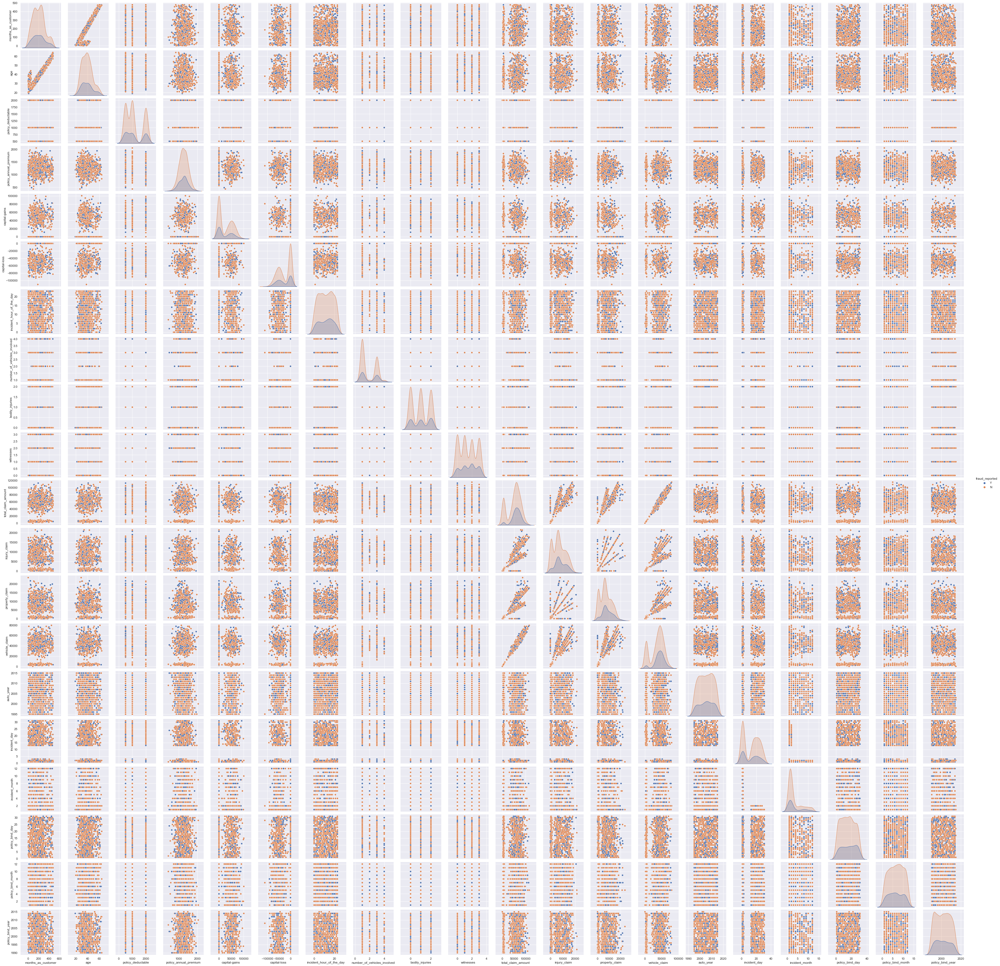

In [174]:
sns.pairplot(df,hue="fraud_reported")

# Checking Outliers:-

<AxesSubplot:>

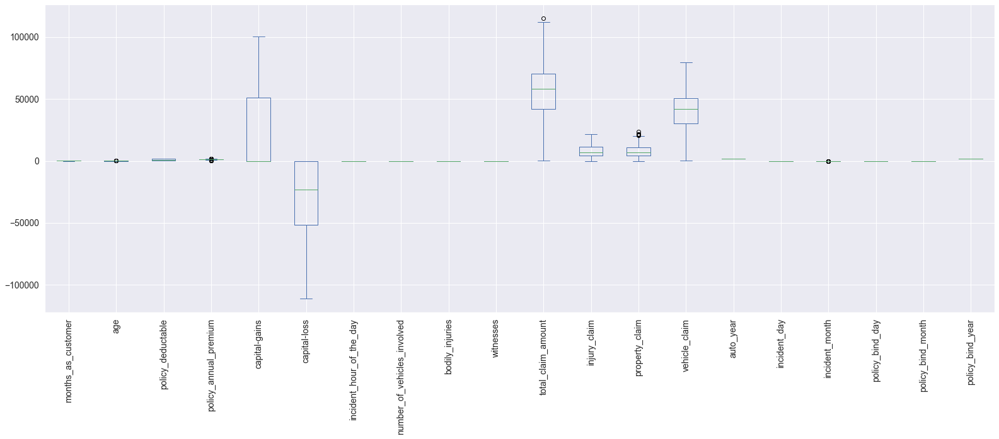

In [186]:
df.plot(rot = 90,kind='box',fontsize=14,figsize=(27,9))

months_as_customer                AxesSubplot(0.125,0.749828;0.133621x0.130172)
age                            AxesSubplot(0.285345,0.749828;0.133621x0.130172)
policy_deductable               AxesSubplot(0.44569,0.749828;0.133621x0.130172)
policy_annual_premium          AxesSubplot(0.606034,0.749828;0.133621x0.130172)
capital-gains                  AxesSubplot(0.766379,0.749828;0.133621x0.130172)
capital-loss                      AxesSubplot(0.125,0.593621;0.133621x0.130172)
incident_hour_of_the_day       AxesSubplot(0.285345,0.593621;0.133621x0.130172)
number_of_vehicles_involved     AxesSubplot(0.44569,0.593621;0.133621x0.130172)
bodily_injuries                AxesSubplot(0.606034,0.593621;0.133621x0.130172)
witnesses                      AxesSubplot(0.766379,0.593621;0.133621x0.130172)
total_claim_amount                AxesSubplot(0.125,0.437414;0.133621x0.130172)
injury_claim                   AxesSubplot(0.285345,0.437414;0.133621x0.130172)
property_claim                  AxesSubp

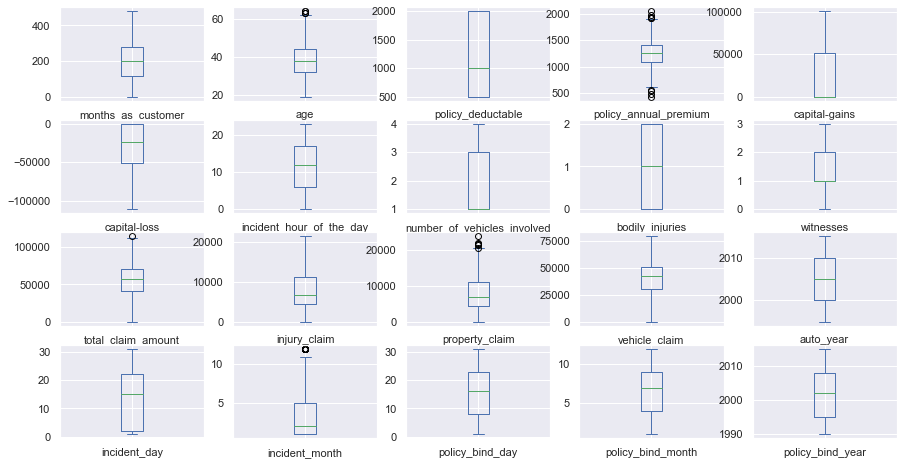

In [176]:
df.plot(kind='box',subplots=True,layout=(5,5),figsize=(15,10))

we can clearly see there are some outliers present in some columns

# Removing outliers using Zscore:-

In [187]:
features=df[['age','policy_annual_premium','total_claim_amount','property_claim','incident_month']]

In [188]:
# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

z

,age,policy_annual_premium,total_claim_amount,property_claim,incident_month
0,0.990836,0.616705,0.714257,1.165505,0.735040
1,0.334073,0.242521,1.807312,1.372696,0.735040
2,1.088913,0.642233,0.686362,0.736072,0.429664
3,0.224613,0.652886,0.403135,0.219722,2.013343
4,0.552994,1.341980,1.753121,1.399654,0.429664
...,...,...,...,...,...
995,0.103769,0.222884,1.305049,0.273817,0.429664
996,0.224613,0.739141,2.111466,2.214794,0.735040
997,0.541611,0.520739,0.558507,0.020826,0.735040
998,2.523284,0.411866,0.219110,0.451976,0.429664


In [189]:
new_df = df[(z<3).all(axis=1)] 
new_df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,incident_day,incident_month,policy_bind_day,policy_bind_month,policy_bind_year
0,328,48,OH,250/500,1000,1406.91,MALE,MD,craft-repair,sleeping,...,52080,Saab,92x,2004,Y,25,1,17,10,2014
1,228,42,IN,250/500,2000,1197.22,MALE,MD,machine-op-inspct,reading,...,3510,Mercedes,E400,2007,Y,21,1,27,6,2006
2,134,29,OH,100/300,2000,1413.14,FEMALE,PhD,sales,board-games,...,23100,Dodge,RAM,2007,N,22,2,9,6,2000
3,256,41,IL,250/500,2000,1415.74,FEMALE,PhD,armed-forces,board-games,...,50720,Chevrolet,Tahoe,2014,Y,1,10,25,5,1990
4,228,44,IL,500/1000,1000,1583.91,MALE,Associate,sales,board-games,...,4550,Accura,RSX,2009,N,17,2,6,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,FEMALE,Masters,craft-repair,paintball,...,61040,Honda,Accord,2006,N,22,2,16,7,1991
996,285,41,IL,100/300,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,...,72320,Volkswagen,Passat,2015,N,24,1,1,5,2014
997,130,34,OH,250/500,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,...,52500,Suburu,Impreza,1996,N,23,1,17,2,2003
998,458,62,IL,500/1000,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,...,36540,Audi,A5,1998,N,26,2,18,11,2011


In [190]:
df.shape

(1000, 38)

In [191]:
new_df.shape

(996, 38)

we can clearly see that some data are removing from previous dataset

# % of data loss:-

In [192]:
data_loss = (1000-996)/1000*100
data_loss

0.4

we can see only 0.4% data loss using Zscore method.

# Lets try IQR (Inter Quantile Range) method:-

In [193]:
# 1st quantile
Q1=features.quantile(0.25)
# 3rd quantile
Q3=features.quantile(0.75)
# IQR
IQR=Q3 - Q1

In [194]:
df1=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]
df1.shape

(942, 38)

In [195]:
df.shape

(1000, 38)

# %of data loss:-

In [196]:
data_loss2= (1000-942)/1000*100
data_loss2

5.800000000000001

Here we can see we lost 5.80% of data while using IQR method

# Checking the skewness:-

In IQR method  we loss 5.80% of data so here we consider df1 as ourdataset 

In [197]:
df1.skew()

months_as_customer             0.345945
age                            0.446346
policy_deductable              0.466807
policy_annual_premium          0.005067
capital-gains                  0.461870
capital-loss                  -0.378917
incident_hour_of_the_day      -0.033082
number_of_vehicles_involved    0.513867
bodily_injuries                0.015747
witnesses                      0.023496
total_claim_amount            -0.611519
injury_claim                   0.270153
property_claim                 0.293688
vehicle_claim                 -0.624344
auto_year                     -0.047164
incident_day                  -0.016124
incident_month                 1.445659
policy_bind_day                0.036075
policy_bind_month             -0.030920
policy_bind_year               0.054471
dtype: float64

Skewness allowed limit is +/- 0.50, here skewness is present in 3 columns total_claim_amount, vehicle_claim, incident_month

In [198]:
feature=['total_claim_amount','vehicle_claim','incident_month']

In [199]:
from sklearn.preprocessing import PowerTransformer
scaler=PowerTransformer(method='yeo-johnson')

In [200]:
df1[feature]=scaler.fit_transform(df1[feature].values)

In [201]:
df1.skew()

months_as_customer             0.345945
age                            0.446346
policy_deductable              0.466807
policy_annual_premium          0.005067
capital-gains                  0.461870
capital-loss                  -0.378917
incident_hour_of_the_day      -0.033082
number_of_vehicles_involved    0.513867
bodily_injuries                0.015747
witnesses                      0.023496
total_claim_amount            -0.522235
injury_claim                   0.270153
property_claim                 0.293688
vehicle_claim                 -0.529147
auto_year                     -0.047164
incident_day                  -0.016124
incident_month                 0.306751
policy_bind_day                0.036075
policy_bind_month             -0.030920
policy_bind_year               0.054471
dtype: float64

-Here we can see that skewness in all columns have been reduced. its almost like normal now.

# Encoding the data useing LabelEncoding:-

In [202]:
categorical_col

['policy_state',
 'policy_csl',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

In [204]:
from sklearn.preprocessing import LabelEncoder

In [205]:
LE=LabelEncoder()
df1[categorical_col]= new_df[categorical_col].apply(LE.fit_transform)
df1[categorical_col]

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1
1,1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1
2,2,0,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0
3,0,1,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1
4,0,2,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2,2,0,5,2,13,4,2,0,1,1,0,4,1,0,6,6,0
996,0,0,0,6,9,17,5,2,1,0,1,4,3,1,0,13,28,0
997,2,1,0,5,1,3,2,0,2,1,4,0,0,0,1,11,19,0
998,0,2,1,0,5,0,5,2,1,0,3,1,0,0,1,1,5,0


-Here we see that we have successfully encoded the category columns in our dataset.

# correlation:-

In [207]:
cor=df1.corr()
cor

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,incident_day,incident_month,policy_bind_day,policy_bind_month,policy_bind_year
months_as_customer,1.000000,0.922350,0.000001,-0.012156,0.024438,-0.003805,0.062336,-0.008878,0.013290,-0.104553,...,0.052019,0.054873,-0.000714,-0.007779,0.028933,-0.004094,0.004985,0.039447,0.011691,-0.050956
age,0.922350,1.000000,-0.011340,-0.013729,0.034285,0.004366,0.080611,-0.005074,0.029198,-0.096685,...,0.052082,0.039775,0.013702,-0.003538,0.018024,0.000284,0.004252,0.038000,0.024898,-0.041349
policy_state,0.000001,-0.011340,1.000000,0.006368,0.018064,0.021877,-0.017676,-0.035727,-0.037907,-0.029238,...,-0.006113,0.023774,-0.026846,-0.000528,0.017314,0.020909,0.022659,-0.004953,0.069853,-0.012156
policy_csl,-0.012156,-0.013729,0.006368,1.000000,0.014690,0.029557,-0.012023,0.009139,0.021555,-0.003813,...,-0.042327,0.014747,0.043850,-0.025014,-0.038140,0.002854,-0.059583,0.009269,-0.046961,-0.030996
policy_deductable,0.024438,0.034285,0.018064,0.014690,1.000000,0.003130,-0.014966,0.022860,-0.043651,0.001407,...,0.003685,-0.034852,-0.009051,0.025086,0.028751,-0.027694,0.008783,0.008596,-0.048580,-0.056176
policy_annual_premium,-0.003805,0.004366,0.021877,0.029557,0.003130,1.000000,0.047584,-0.036306,0.027375,-0.013902,...,0.005242,0.020065,-0.045057,-0.033779,-0.018745,0.012531,-0.008901,-0.044866,-0.020588,0.013034
insured_sex,0.062336,0.080611,-0.017676,-0.012023,-0.014966,0.047584,1.000000,0.009732,-0.013823,-0.010957,...,-0.021664,0.030897,-0.008054,-0.032496,0.027771,-0.009320,0.023456,0.042395,-0.003734,-0.037374
insured_education_level,-0.008878,-0.005074,-0.035727,0.009139,0.022860,-0.036306,0.009732,1.000000,-0.034695,0.022574,...,0.068928,0.049418,0.051959,0.042772,0.018458,-0.045565,0.054039,0.018790,0.002520,0.024970
insured_occupation,0.013290,0.029198,-0.037907,0.021555,-0.043651,0.027375,-0.013823,-0.034695,1.000000,-0.003935,...,-0.005962,0.036184,0.032652,-0.002548,0.008218,-0.021669,0.010757,0.007604,0.023495,-0.022849
insured_hobbies,-0.104553,-0.096685,-0.029238,-0.003813,0.001407,-0.013902,-0.010957,0.022574,-0.003935,1.000000,...,-0.034587,0.004938,0.043625,0.003304,-0.049562,0.011427,0.002127,0.039376,0.008186,-0.003625


<AxesSubplot:>

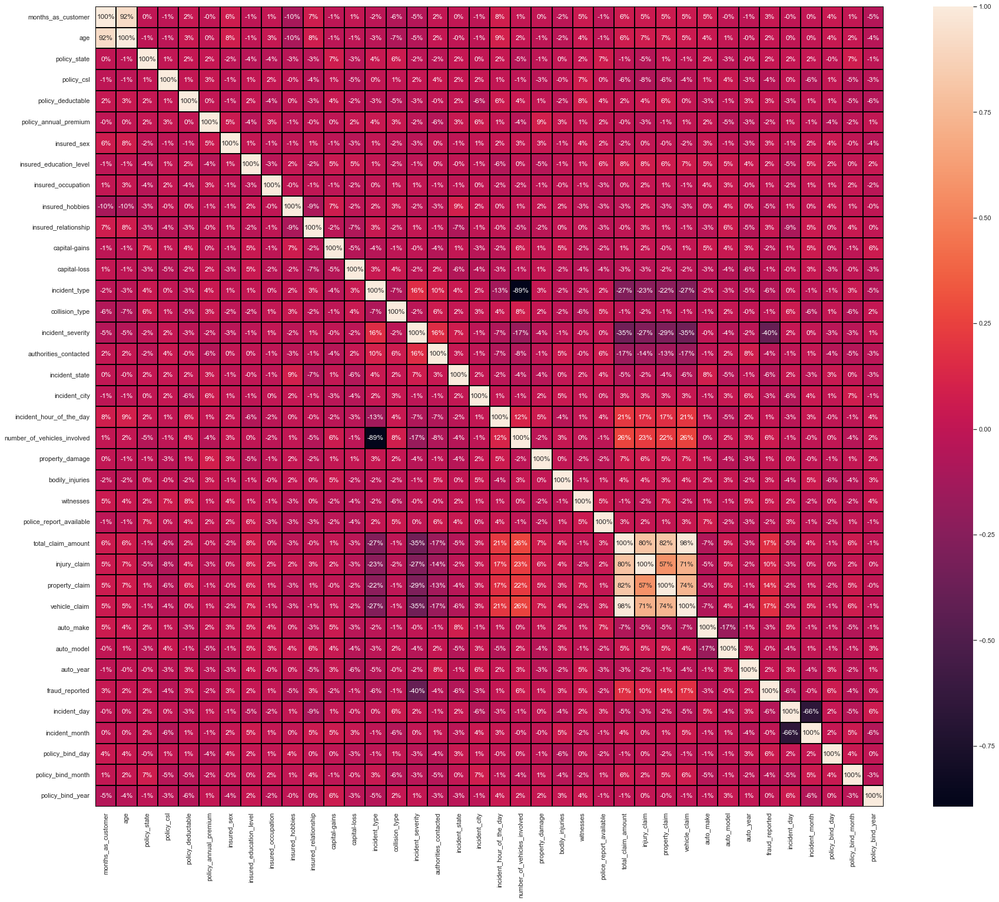

In [211]:
plt.figure(figsize=(30,25))
sns.heatmap(df1.corr(),annot=True,linewidth=0.01,linecolor='black',fmt='0.0%')

# Visualizing correlation using bar plot:-

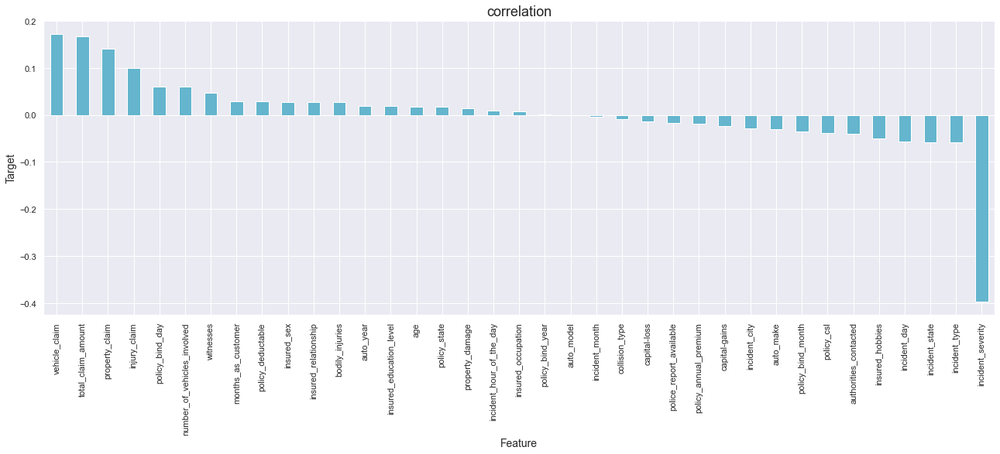

In [213]:
plt.figure(figsize=(22,7))
df1.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

# Separating the features and label:-

In [214]:
x=df1.drop('fraud_reported', axis=1)
y=df1['fraud_reported']

In [215]:
x.shape

(942, 37)

In [216]:
y.shape

(942,)

# Scaling the data using standard scaler:-

In [217]:
from sklearn.preprocessing import StandardScaler

In [218]:
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,incident_day,incident_month,policy_bind_day,policy_bind_month,policy_bind_year
0,1.100113,1.019050,1.186970,0.072568,-0.232224,0.631679,1.077288,0.536898,-1.166367,1.313950,...,1.225715,0.765233,0.842022,-1.636061,-0.180440,1.100060,-1.090575,0.178344,1.012391,1.695275
1,0.215908,0.351107,-0.021815,0.072568,1.406391,-0.258130,1.077288,0.536898,-0.170249,0.957252,...,-1.391485,-1.781444,0.346436,-0.651460,0.317532,0.715014,-1.090575,1.308135,-0.169359,0.601193
2,-0.615246,-1.096102,1.186970,-1.170330,1.406391,0.658115,-0.928256,1.563818,1.074897,-1.361282,...,-0.735047,-0.812787,-0.644734,0.959706,0.317532,0.811275,0.069233,-0.725489,-0.169359,-0.219368
3,0.463485,0.239783,-1.230599,0.072568,1.406391,0.669148,-0.928256,1.563818,-1.415396,-1.361282,...,-0.202626,0.688991,-0.892527,1.317743,1.479465,-1.210220,1.644008,1.082177,-0.464796,-1.586970
4,0.215908,0.573755,-1.230599,1.315467,-0.232224,1.382769,1.077288,-1.516942,1.074897,-1.361282,...,-1.419282,-1.734673,-1.635905,1.049215,0.649513,0.329967,0.069233,-1.064426,-0.169359,1.695275
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937,-1.773555,-0.094188,1.186970,1.315467,-0.232224,0.223841,-0.928256,1.050358,-1.166367,0.600555,...,0.306274,1.271665,-0.149149,-1.188515,0.151541,0.811275,0.069233,0.065365,0.126078,-1.450210
938,0.719905,0.239783,-1.230599,-1.170330,-0.232224,0.758473,-0.928256,1.563818,0.576839,1.313950,...,2.307662,1.918362,1.585400,0.780688,1.645455,1.003799,-1.090575,-1.629322,-0.464796,1.695275
939,-0.650614,-0.539483,1.186970,0.072568,-1.051531,0.532297,-0.928256,1.050358,-1.415396,-1.182934,...,0.045409,0.788813,1.089814,-0.024895,-1.508363,0.907537,-1.090575,0.178344,-1.351109,0.190913
940,2.249580,2.577584,-1.230599,1.315467,1.406391,0.419549,1.077288,-1.516942,-0.419279,-1.717980,...,-0.442109,-0.094481,-1.388113,-1.278024,-1.176382,1.196322,0.069233,0.291323,1.307828,1.284994


# Multicolinearity (VIF) :-

In [221]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Feat"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["Feat"]=x.columns
vif

,vif_Feat,Feat
0,6.846025,months_as_customer
1,6.887071,age
2,1.040380,policy_state
3,1.040923,policy_csl
4,1.048257,policy_deductable
5,1.037908,policy_annual_premium
6,1.034848,insured_sex
7,1.046815,insured_education_level
8,1.019456,insured_occupation
9,1.052186,insured_hobbies


Vif should be below 10, here total_claim_amount, injury_claim, property_claim, vehicle_claim have score far above 10.

In [222]:
x=x.drop(["total_claim_amount"],axis=1)

In [223]:
vif=pd.DataFrame()
vif["vif_Feat"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["Feat"]=x.columns
vif

,vif_Feat,Feat
0,6.845652,months_as_customer
1,6.887064,age
2,1.040376,policy_state
3,1.039250,policy_csl
4,1.047472,policy_deductable
5,1.037237,policy_annual_premium
6,1.032175,insured_sex
7,1.046432,insured_education_level
8,1.019420,insured_occupation
9,1.051284,insured_hobbies


Now we can see the multicolinearity issue is solved. All the VIF values are below 10 now.

# Oversampling:-

In [224]:
# lets check the value count of target column
y.value_counts()

0    710
1    232
Name: fraud_reported, dtype: int64

Here we can see the data is imbalanced

In [225]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x,y =sm.fit_resample(x,y)

In [226]:
y.value_counts()

1    710
0    710
Name: fraud_reported, dtype: int64

Now we can see the data is balanced

# Finding Best Random State and Accuracy:-

In [231]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier

In [232]:
maxAccu=0           #max accuracy    
maxRS=0             #for best ranom state value for wuich max accuracy is acheived
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    RFC=RandomForestClassifier()
    RFC.fit(x_train, y_train)        #fitting the data 
    pred = RFC.predict(x_test)        #predicted target variable
    acc=accuracy_score(y_test, pred)
    print('accuracy : ',acc,'random state :',i)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i

accuracy :  0.8591549295774648 random state : 1
accuracy :  0.8403755868544601 random state : 2
accuracy :  0.8779342723004695 random state : 3
accuracy :  0.8873239436619719 random state : 4
accuracy :  0.8849765258215962 random state : 5
accuracy :  0.8967136150234741 random state : 6
accuracy :  0.8474178403755869 random state : 7
accuracy :  0.8732394366197183 random state : 8
accuracy :  0.8732394366197183 random state : 9
accuracy :  0.9014084507042254 random state : 10
accuracy :  0.8427230046948356 random state : 11
accuracy :  0.8661971830985915 random state : 12
accuracy :  0.9061032863849765 random state : 13
accuracy :  0.8497652582159625 random state : 14
accuracy :  0.8779342723004695 random state : 15
accuracy :  0.8755868544600939 random state : 16
accuracy :  0.8849765258215962 random state : 17
accuracy :  0.8896713615023474 random state : 18
accuracy :  0.9014084507042254 random state : 19
accuracy :  0.8708920187793427 random state : 20
accuracy :  0.866197183098591

In [233]:
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9061032863849765  on Random_state  13


Here we have got prediction of 90% accuracy at random state 13

# Creating train test split:-

In [234]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.27,random_state=maxRS)

# Import Classification Libraries :-

In [235]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.naive_bayes import GaussianNB as NB
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score

# Logistic Regression:-

In [236]:
LR = LogisticRegression()
LR.fit(x_train,y_train)
# Prediction
predLR = LR.predict(x_test)

print('Accuracy is :-',accuracy_score(y_test, predLR))
print(confusion_matrix(y_test, predLR))
print(classification_report(y_test,predLR))

Accuracy is :- 0.7552083333333334
[[155  48]
 [ 46 135]]
              precision    recall  f1-score   support

           0       0.77      0.76      0.77       203
           1       0.74      0.75      0.74       181

    accuracy                           0.76       384
   macro avg       0.75      0.75      0.75       384
weighted avg       0.76      0.76      0.76       384



here accuracy is 75%

Text(0.5, 1.0, 'Confusion Matrix for Logistic Regression Classifier')

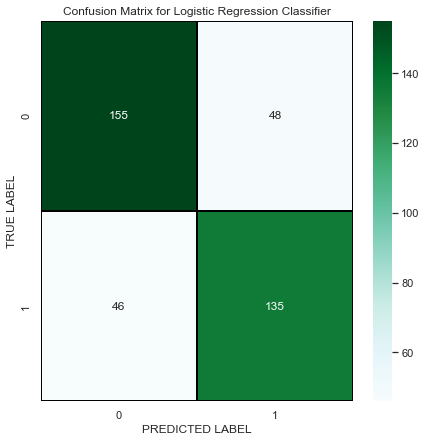

In [237]:
cm = confusion_matrix(y_test,predLR)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f,ax=plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Logistic Regression Classifier')

# DecisionTreeClassifier:-

In [238]:
DTC = DecisionTreeClassifier()
DTC.fit(x_train,y_train)
predDTC = DTC.predict(x_test)   #prediction

print('accuracy is :-',accuracy_score(y_test, predDTC))
print(confusion_matrix(y_test, predDTC))
print(classification_report(y_test,predDTC))

accuracy is :- 0.828125
[[169  34]
 [ 32 149]]
              precision    recall  f1-score   support

           0       0.84      0.83      0.84       203
           1       0.81      0.82      0.82       181

    accuracy                           0.83       384
   macro avg       0.83      0.83      0.83       384
weighted avg       0.83      0.83      0.83       384



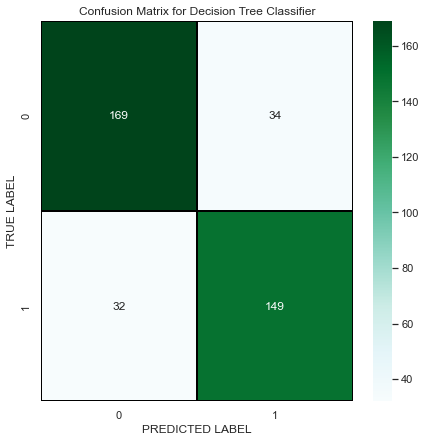

In [239]:
cm = confusion_matrix(y_test,predDTC)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()

# Random Forest Classifier:-

In [240]:
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)
# Prediction
predRFC = RFC.predict(x_test)

print('accuracy is :-',accuracy_score(y_test, predRFC))
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test,predRFC))

accuracy is :- 0.9036458333333334
[[191  12]
 [ 25 156]]
              precision    recall  f1-score   support

           0       0.88      0.94      0.91       203
           1       0.93      0.86      0.89       181

    accuracy                           0.90       384
   macro avg       0.91      0.90      0.90       384
weighted avg       0.91      0.90      0.90       384



Here accuracy is 90%

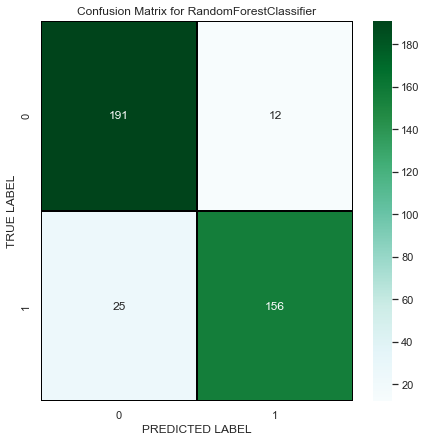

In [241]:
cm = confusion_matrix(y_test,predRFC)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f,ax=plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

# KNeighbors Classifier:-

In [242]:
knn = KNN()
knn.fit(x_train,y_train)

# Prediction
predknn = knn.predict(x_test)

print('Accuracy is:-',accuracy_score(y_test, predknn))
print(confusion_matrix(y_test, predknn))
print(classification_report(y_test,predknn))

Accuracy is:- 0.6171875
[[ 62 141]
 [  6 175]]
              precision    recall  f1-score   support

           0       0.91      0.31      0.46       203
           1       0.55      0.97      0.70       181

    accuracy                           0.62       384
   macro avg       0.73      0.64      0.58       384
weighted avg       0.74      0.62      0.57       384



here accuracy is 61%

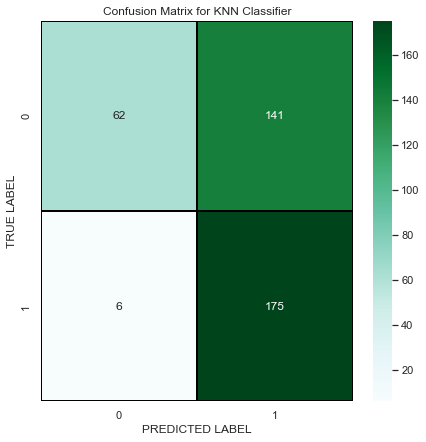

In [243]:
cm = confusion_matrix(y_test,predknn)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for KNN Classifier')
plt.show()

# Gradient Boosting Classifier:-

In [244]:
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)

# Prediction
predGB = GB.predict(x_test)

print('Accuracy is :- ',accuracy_score(y_test, predGB))
print(confusion_matrix(y_test, predGB))
print(classification_report(y_test,predGB))

Accuracy is :-  0.9036458333333334
[[190  13]
 [ 24 157]]
              precision    recall  f1-score   support

           0       0.89      0.94      0.91       203
           1       0.92      0.87      0.89       181

    accuracy                           0.90       384
   macro avg       0.91      0.90      0.90       384
weighted avg       0.90      0.90      0.90       384



Accuracy using Gradient Boosting Classifier is 90%

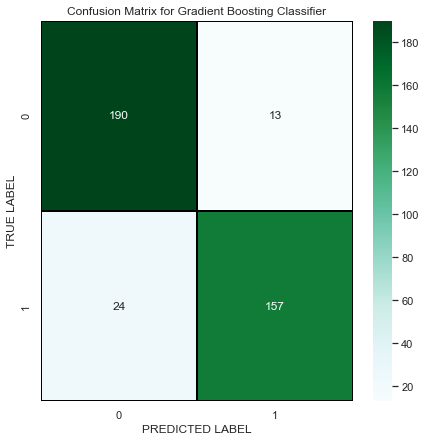

In [245]:
cm = confusion_matrix(y_test,predGB)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

# Extra tree classifier:-

In [246]:
ETC=ExtraTreesClassifier()
ETC.fit(x_train,y_train)
predETC=ETC.predict(x_test)
print("Accuracy Score: ", accuracy_score(y_test,predETC))
print("Confusion Matrix: ",confusion_matrix(y_test,predETC))
print(classification_report(y_test,predETC))

Accuracy Score:  0.9244791666666666
Confusion Matrix:  [[189  14]
 [ 15 166]]
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       203
           1       0.92      0.92      0.92       181

    accuracy                           0.92       384
   macro avg       0.92      0.92      0.92       384
weighted avg       0.92      0.92      0.92       384



Accuracy score using ETC is 92%

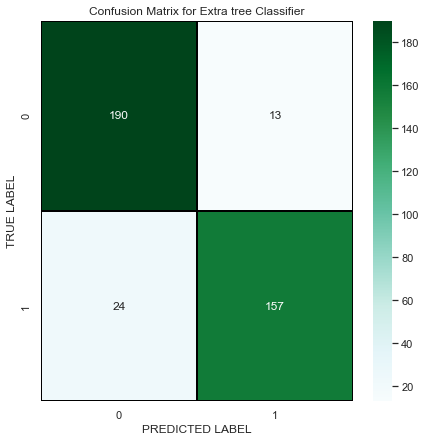

In [247]:
cm = confusion_matrix(y_test,predGB)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Extra tree Classifier')
plt.show()

# Cross Validation:-

In [248]:
from sklearn.model_selection import cross_val_score

In [249]:
scr=cross_val_score(LR,x,y,cv=5)
print('Cross Validation score of Logistic Regression model : ',scr.mean())

Cross Validation score of Logistic Regression model :  0.7401408450704225


In [250]:
scr2=cross_val_score(DTC,x,y,cv=5)
print('Cross Validation score of Decision tree model : ',scr2.mean())

Cross Validation score of Decision tree model :  0.823943661971831


In [251]:
scr3=cross_val_score(RFC,x,y,cv=5)
print('Cross Validation score of Random Forest model : ',scr3.mean())

Cross Validation score of Random Forest model :  0.8640845070422536


In [252]:
scr4=cross_val_score(knn,x,y,cv=5)
print('Cross Validation score of kNN model : ',scr4.mean())

Cross Validation score of kNN model :  0.6584507042253522


In [253]:
scr5=cross_val_score(GB,x,y,cv=5)
print('Cross Validation score of SVC model : ',scr5.mean())

Cross Validation score of SVC model :  0.8690140845070422


In [254]:
scr6=cross_val_score(ETC,x,y,cv=5)
print('Cross Validation score of ETC model : ',scr6.mean())

Cross Validation score of ETC model :  0.9084507042253522


Here the Cross Validation scores of all the models

# Hyper Parameter Tuning:-

In [255]:
from sklearn.model_selection import GridSearchCV

In [256]:
parameter= {'criterion':['gini','entropy'],
             'random_state': [10,100,1000],
             'n_jobs':[-2,-1,1,2],
             'n_estimators':[100,200,300],
             'max_depth': [0,10,20]}

In [257]:
gcv=GridSearchCV(ExtraTreesClassifier(),parameter,cv=5)

In [258]:
gcv.fit(x_train,y_train)

Exception in thread ExecutorManagerThread:
Traceback (most recent call last):
  File "C:\Users\sony\anaconda3\lib\site-packages\psutil\_pswindows.py", line 679, in wrapper
    return fun(self, *args, **kwargs)
  File "C:\Users\sony\anaconda3\lib\site-packages\psutil\_pswindows.py", line 863, in kill
    return cext.proc_kill(self.pid)
PermissionError: [WinError 5] Access is denied: '(originated from OpenProcess)'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\sony\anaconda3\lib\threading.py", line 973, in _bootstrap_inner
    self.run()
  File "C:\Users\sony\anaconda3\lib\site-packages\joblib\externals\loky\process_executor.py", line 575, in run
    self.flag_executor_shutting_down()
  File "C:\Users\sony\anaconda3\lib\site-packages\joblib\externals\loky\process_executor.py", line 770, in flag_executor_shutting_down
    self.kill_workers(reason="executor shutting down")
  File "C:\Users\sony\anaconda3\lib\site-p

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [100, 200, 300],
                         'n_jobs': [-2, -1, 1, 2],
                         'random_state': [10, 100, 1000]})

In [259]:
gcv.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'n_estimators': 300,
 'n_jobs': -2,
 'random_state': 1000}

In [260]:
model=ExtraTreesClassifier(criterion='gini', max_depth=20 ,n_estimators=300 , n_jobs=-2 , random_state=1000 )
model.fit(x_train,y_train)
pred=model.predict(x_test)
acc=accuracy_score(y_test, pred)

print('Accuracy Score:',(accuracy_score(y_test,pred)*100))
print('Confusion matrix:',confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy Score: 92.1875
Confusion matrix: [[188  15]
 [ 15 166]]
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       203
           1       0.92      0.92      0.92       181

    accuracy                           0.92       384
   macro avg       0.92      0.92      0.92       384
weighted avg       0.92      0.92      0.92       384



After Hyper Parameter Tuning we can see score is improved by almost 2 % as compared to the Accuracy_Score.

# ROC-AUC curve:-

In [261]:
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 

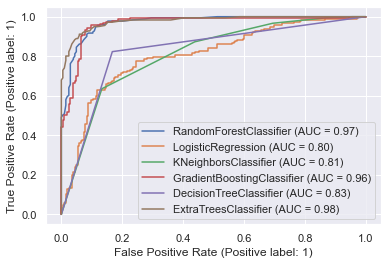

In [264]:
disp=plot_roc_curve(RFC,x_test,y_test)
# ax_=Axes with confusion matrix
plot_roc_curve(LR, x_test, y_test, ax=disp.ax_)
plot_roc_curve(knn, x_test, y_test, ax=disp.ax_)
plot_roc_curve(GB, x_test, y_test, ax=disp.ax_)
plot_roc_curve(DTC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(ETC, x_test, y_test, ax=disp.ax_)
plt.legend(prop={'size':11}, loc='lower right')
plt.show()

# Saving the model:-

In [265]:
import joblib
joblib.dump(model,"InsuranceClaim_FraudDetection_project.pkl")

['InsuranceClaim_FraudDetection_project.pkl']

# Lets Predicting the saved model:-

In [267]:
model=joblib.load("InsuranceClaim_FraudDetection_project.pkl")

#Prediction
prediction = model.predict(x_test)
prediction

array([0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0,
       0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1,
       0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1,
       0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1,

In [268]:
pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"]).T   #T for table format

,Predicted,Original
0,0,1
1,0,0
2,1,1
3,1,1
4,0,0
...,...,...
379,0,0
380,1,1
381,0,0
382,1,1


it looks like all the actual and predicted values are almost same.

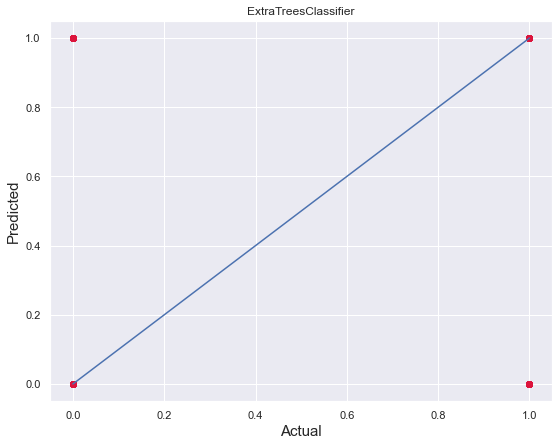

In [269]:
plt.figure(figsize=(9,7))
plt.scatter(y_test, prediction, c='crimson')
p1 = max(max(prediction), max(y_test))
p2 = min(min(prediction), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual', fontsize=15)
plt.ylabel('Predicted', fontsize=15)
plt.title("ExtraTreesClassifier")
plt.show()